In [63]:
import numpy as np
import scipy.signal
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import tensorflow as tf
from PIL import Image
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Dropout, BatchNormalization
import tensorflow.keras.backend as K
import csv
from tensorflow.keras import optimizers
from skimage import transform
from tensorflow.keras.preprocessing.image import ImageDataGenerator
tf_config = tf.compat.v1.ConfigProto(allow_soft_placement=False)
tf_config.gpu_options.allow_growth = True
s = tf.compat.v1.Session(config=tf_config)
tf.compat.v1.keras.backend.set_session(s);

# https://www.kaggle.com/jutrera/stanford-car-dataset-by-classes-folder

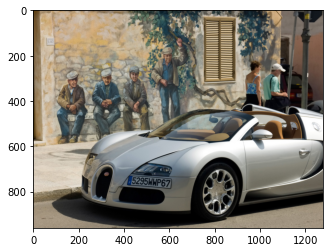

In [2]:
# Example Image
img = mpimg.imread('projectdata/car_data/car_data/train/Bugatti Veyron 16.4 Convertible 2009/00190.jpg') 
imgs1 = plt.imshow(img)

In [89]:
# name of the classes
classes = []

with open('projectdata/names.csv') as csvDataFile:
    csvReader = csv.reader(csvDataFile, delimiter=';')
    for row in csvReader:
        classes.append(row[0])
        
classes.sort()

# print how many classes are there
print(len(classes))

196


In [3]:
# generator for training data
training_data_generator = ImageDataGenerator(
        featurewise_center=False,
        samplewise_center=False,
        featurewise_std_normalization=False,
        samplewise_std_normalization=False,
        zca_whitening=False,
        zca_epsilon=1e-06,
        rotation_range=0,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.,
        zoom_range=0.,
        channel_shift_range=0.,
        fill_mode='nearest',
        cval=0.,
        horizontal_flip=True,
        vertical_flip=False,
        rescale=1./255,
        preprocessing_function=None,
        data_format=None,
        validation_split=0.0)

#generator for testing data
testing_data_generator = ImageDataGenerator(
        featurewise_center=False,
        samplewise_center=False,
        featurewise_std_normalization=False,
        samplewise_std_normalization=False,
        zca_whitening=False,
        zca_epsilon=1e-06,
        rotation_range=0,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.,
        zoom_range=0.,
        channel_shift_range=0.,
        fill_mode='nearest',
        cval=0.,
        horizontal_flip=True,
        vertical_flip=False,
        rescale=1./255,
        preprocessing_function=None,
        data_format=None,
        validation_split=0.0)

# training data with flow function, batch size 32 and resize to 256, 256
training_data = training_data_generator.flow_from_directory('projectdata/car_data/car_data/train/',
                                              target_size=(256,256),
                                              batch_size=32,
                                              class_mode='categorical')

# testing data with flow function, batch size 32 and resize to 256, 256
testing_data = testing_data_generator.flow_from_directory('projectdata/car_data/car_data/test',
                                              target_size=(256,256),
                                              batch_size=32,
                                              class_mode='categorical')

Found 8144 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.


In [65]:
K.clear_session()

kernel_size = (3,3)

# 1st Model: 1 Conv2D Layer
model1 = Sequential()
model1.add(Conv2D(32, input_shape=(256, 256, 3), kernel_size=kernel_size, padding='valid', activation='relu'))
model1.add(MaxPooling2D(pool_size=(2, 2)))
model1.add(BatchNormalization())
model1.add(Dropout(0.5))

model1.add(Flatten())

model1.add(Dense(512, activation = 'relu'))
model1.add(BatchNormalization())
model1.add(Dropout(0.5))

model1.add(Dense(units=196,activation='softmax'))

# optimizer
opt = optimizers.RMSprop(learning_rate=1e-3, decay=1e-4)
model1.compile(loss='categorical_crossentropy',
                  optimizer=opt,
                  metrics=['accuracy'])

# fitting the model
hist1 = model1.fit(training_data,
                            epochs=50,
                            steps_per_epoch=50,
                            validation_data=testing_data,
                            validation_steps=50)




Epoch 1/50
50/50 [==============================] - 44s 864ms/step - loss: 6.1966 - accuracy: 0.0106 - val_loss: 5.3828 - val_accuracy: 0.0113
Epoch 2/50
50/50 [==============================] - 41s 822ms/step - loss: 6.0026 - accuracy: 0.0107 - val_loss: 5.3155 - val_accuracy: 0.0150
Epoch 3/50
50/50 [==============================] - 41s 830ms/step - loss: 5.8649 - accuracy: 0.0120 - val_loss: 5.2744 - val_accuracy: 0.0100
Epoch 4/50
50/50 [==============================] - 42s 838ms/step - loss: 5.7358 - accuracy: 0.0169 - val_loss: 5.2582 - val_accuracy: 0.0094
Epoch 5/50
50/50 [==============================] - 41s 829ms/step - loss: 5.5871 - accuracy: 0.0221 - val_loss: 5.2355 - val_accuracy: 0.0106
Epoch 6/50
50/50 [==============================] - 43s 860ms/step - loss: 5.5488 - accuracy: 0.0162 - val_loss: 5.2165 - val_accuracy: 0.0131
Epoch 7/50
50/50 [==============================] - 41s 833ms/step - loss: 5.5053 - accuracy: 0.0150 - val_loss: 5.2256 - val_accuracy: 0.0194

In [4]:
K.clear_session()

kernel_size = (3,3)

# 2nd Model: 3 Conv2D Layer
model2 = Sequential()
model2.add(Conv2D(32, input_shape=(256, 256, 3), kernel_size=kernel_size, padding='valid', activation='relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(BatchNormalization())
model2.add(Dropout(0.5))

model2.add(Conv2D(32, kernel_size=kernel_size, activation='relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(BatchNormalization())
model2.add(Dropout(0.5))

model2.add(Conv2D(32, kernel_size=kernel_size, activation='relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(BatchNormalization())
model2.add(Dropout(0.5))

model2.add(Flatten())

model2.add(Dense(512, activation = 'relu'))
model2.add(BatchNormalization())
model2.add(Dropout(0.5))

model2.add(Dense(units=196,activation='softmax'))

# optimizer
opt = optimizers.RMSprop(learning_rate=1e-3, decay=1e-4)
model2.compile(loss='categorical_crossentropy',
                  optimizer=opt,
                  metrics=['accuracy'])

# fitting the model

hist2 = model2.fit(training_data,
                            epochs=50,
                            steps_per_epoch=100,
                            validation_data=testing_data,
                            validation_steps=50)

Epoch 1/50
100/100 [==============================] - 65s 627ms/step - loss: 6.2118 - accuracy: 0.0082 - val_loss: 7.1120 - val_accuracy: 0.0037
Epoch 2/50
100/100 [==============================] - 62s 624ms/step - loss: 5.8458 - accuracy: 0.0119 - val_loss: 7.1168 - val_accuracy: 0.0056
Epoch 3/50
100/100 [==============================] - 64s 639ms/step - loss: 5.6658 - accuracy: 0.0150 - val_loss: 5.9487 - val_accuracy: 0.0056
Epoch 4/50
100/100 [==============================] - 63s 626ms/step - loss: 5.5288 - accuracy: 0.0173 - val_loss: 5.6278 - val_accuracy: 0.0081
Epoch 5/50
100/100 [==============================] - 63s 629ms/step - loss: 5.4015 - accuracy: 0.0222 - val_loss: 5.6426 - val_accuracy: 0.0044
Epoch 6/50
100/100 [==============================] - 64s 645ms/step - loss: 5.3000 - accuracy: 0.0200 - val_loss: 5.3448 - val_accuracy: 0.0175
Epoch 7/50
100/100 [==============================] - 63s 628ms/step - loss: 5.2625 - accuracy: 0.0241 - val_loss: 5.3055 - val_ac

In [5]:
K.clear_session()

kernel_size = (3,3)

# 3rd Model: 5 Conv2D Layer
model3 = Sequential()
model3.add(Conv2D(32, input_shape=(256, 256, 3), kernel_size=kernel_size, padding='valid', activation='relu'))
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(BatchNormalization())
model3.add(Dropout(0.5))

model3.add(Conv2D(32, kernel_size=kernel_size, activation='relu'))
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(BatchNormalization())
model3.add(Dropout(0.5))

model3.add(Conv2D(32, kernel_size=kernel_size, activation='relu'))
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(BatchNormalization())
model3.add(Dropout(0.5))

model3.add(Conv2D(32, kernel_size=kernel_size, activation='relu'))
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(BatchNormalization())
model3.add(Dropout(0.5))

model3.add(Conv2D(32, kernel_size=kernel_size, activation='relu'))
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(BatchNormalization())
model3.add(Dropout(0.5))

model3.add(Flatten())

model3.add(Dense(512, activation = 'relu'))
model3.add(BatchNormalization())
model3.add(Dropout(0.5))

model3.add(Dense(units=196,activation='softmax'))

# optimizer
opt = optimizers.RMSprop(learning_rate=1e-3, decay=1e-4)
model3.compile(loss='categorical_crossentropy',
                  optimizer=opt,
                  metrics=['accuracy'])

# fitting the model
hist3 = model3.fit(training_data,
                            epochs=50,
                            steps_per_epoch=100,
                            validation_data=testing_data,
                            validation_steps=50)

Epoch 1/50
100/100 [==============================] - 64s 633ms/step - loss: 6.3995 - accuracy: 0.0044 - val_loss: 5.7734 - val_accuracy: 0.0063
Epoch 2/50
100/100 [==============================] - 64s 640ms/step - loss: 5.9993 - accuracy: 0.0082 - val_loss: 6.1584 - val_accuracy: 0.0069
Epoch 3/50
100/100 [==============================] - 64s 637ms/step - loss: 5.7429 - accuracy: 0.0097 - val_loss: 5.8376 - val_accuracy: 0.0031
Epoch 4/50
100/100 [==============================] - 63s 634ms/step - loss: 5.6272 - accuracy: 0.0088 - val_loss: 5.7002 - val_accuracy: 0.0069
Epoch 5/50
100/100 [==============================] - 63s 633ms/step - loss: 5.5076 - accuracy: 0.0128 - val_loss: 5.5668 - val_accuracy: 0.0037
Epoch 6/50
100/100 [==============================] - 62s 622ms/step - loss: 5.4580 - accuracy: 0.0150 - val_loss: 5.4603 - val_accuracy: 0.0050
Epoch 7/50
100/100 [==============================] - 62s 620ms/step - loss: 5.4228 - accuracy: 0.0166 - val_loss: 5.5139 - val_ac

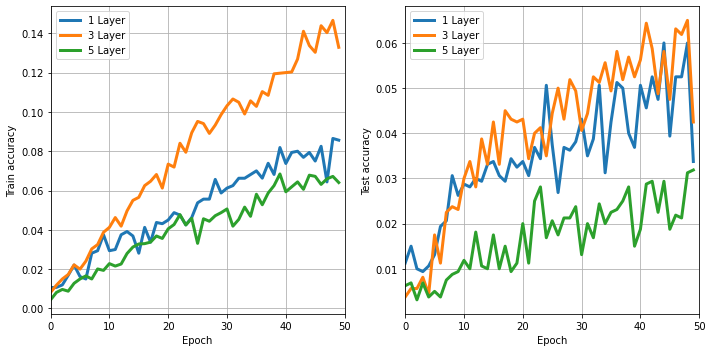

In [70]:
plt.figure(figsize=(10,5))

# plotting graph of training accuracy vs epoch for all 3 models
plt.subplot(1,2,1)
acc1 = hist1.history['accuracy']
plt.plot(acc1, '-', linewidth=3)
acc2 = hist2.history['accuracy']
plt.plot(acc2, '-', linewidth=3)
acc3 = hist3.history['accuracy']
plt.plot(acc3, '-', linewidth=3)
plt.xlim([0, 50])
plt.legend(['1 Layer', '3 Layer', '5 Layer'])
plt.xlabel('Epoch')
plt.ylabel('Train accuracy')
plt.grid()

# plotting graph of testing accuracy vs epoch for all 3 models

plt.subplot(1,2,2)
val_acc1 = hist1.history['val_accuracy']
plt.plot(val_acc1, '-', linewidth=3)
val_acc2 = hist2.history['val_accuracy']
plt.plot(val_acc2, '-', linewidth=3)
val_acc3 = hist3.history['val_accuracy']
plt.plot(val_acc3, '-', linewidth=3)
plt.xlim([0, 50])
plt.legend(['1 Layer', '3 Layer', '5 Layer'])
plt.xlabel('Epoch')
plt.ylabel('Test accuracy')
plt.grid()

plt.tight_layout()

In [90]:
img1 = np.array(Image.open('googled/testing/1.jpg'))
img1 = transform.resize(img1, (256, 256, 3))

img2 = np.array(Image.open('googled/testing/2.jpg'))
img2 = transform.resize(img2, (256, 256, 3))

img3 = np.array(Image.open('googled/testing/3.jpg'))
img3 = transform.resize(img3, (256, 256, 3))

img4 = np.array(Image.open('googled/testing/4.jpg'))
img4 = transform.resize(img4, (256, 256, 3))

img5 = np.array(Image.open('googled/testing/5.jpg'))
img5 = transform.resize(img5, (256, 256, 3))

# 5 images downloaded from google
images = np.array([img1, img2, img3, img4, img5])

# the name of the car corresponding to the 5 images
names = ['Bentley Continental GT Coupe 2012', 
         'Bugatti Veyron 16.4 Convertible 2009', 
         'Ferrari 458 Italia Coupe 2012',
         'Lamborghini Aventador Coupe 2012', 
        'Rolls-Royce Ghost Sedan 2012']

# predict with 1st model
print("1 Layer")
predicted1 = model1.predict(images)
for i in range(5):
    index = np.argmax(predicted1[i])
    print(f"Actual: {names[i]}, Predicted: {classes[index]}")

# predict with 2nd model
print("3 Layer")
predicted2 = model2.predict(images)
for i in range(5):
    index = np.argmax(predicted2[i])
    print(f"Actual: {names[i]}, Predicted: {classes[index]}")
    
# predict with 3rd model
print("5 Layer")
predicted3 = model3.predict(images)
for i in range(5):
    index = np.argmax(predicted3[i])
    print(f"Actual: {names[i]}, Predicted: {classes[index]}")


1 Layer
Actual: Bentley Continental GT Coupe 2012, Predicted: Land Rover Range Rover SUV 2012
Actual: Bugatti Veyron 16.4 Convertible 2009, Predicted: Jaguar XK XKR 2012
Actual: Ferrari 458 Italia Coupe 2012, Predicted: Ferrari 458 Italia Coupe 2012
Actual: Lamborghini Aventador Coupe 2012, Predicted: Lamborghini Gallardo LP 570-4 Superleggera 2012
Actual: Rolls-Royce Ghost Sedan 2012, Predicted: Volkswagen Golf Hatchback 1991
3 Layer
Actual: Bentley Continental GT Coupe 2012, Predicted: BMW X5 SUV 2007
Actual: Bugatti Veyron 16.4 Convertible 2009, Predicted: Nissan Leaf Hatchback 2012
Actual: Ferrari 458 Italia Coupe 2012, Predicted: Ford GT Coupe 2006
Actual: Lamborghini Aventador Coupe 2012, Predicted: Lamborghini Gallardo LP 570-4 Superleggera 2012
Actual: Rolls-Royce Ghost Sedan 2012, Predicted: Volvo 240 Sedan 1993
5 Layer
Actual: Bentley Continental GT Coupe 2012, Predicted: BMW ActiveHybrid 5 Sedan 2012
Actual: Bugatti Veyron 16.4 Convertible 2009, Predicted: Chrysler Crossfire

<ipython-input-103-37df4761327d>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


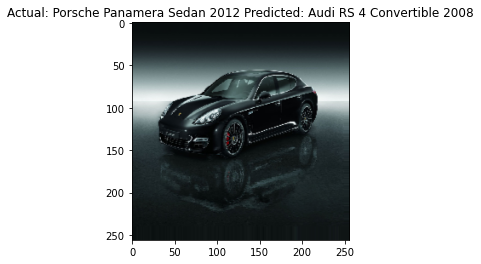

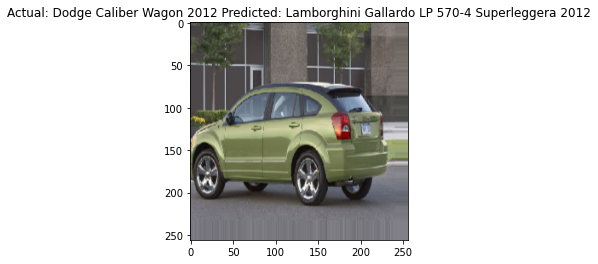

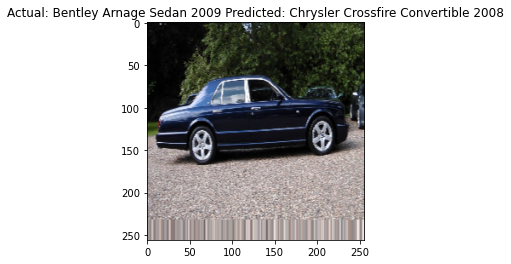

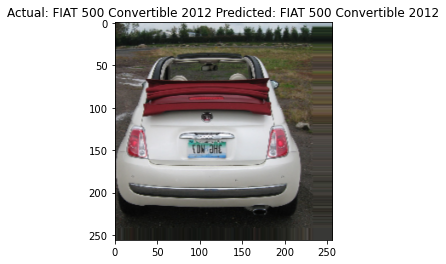

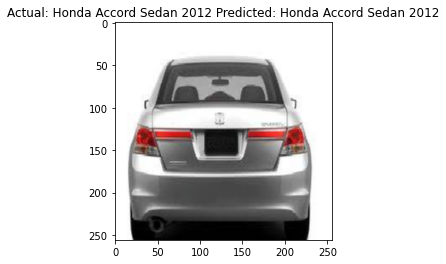

...

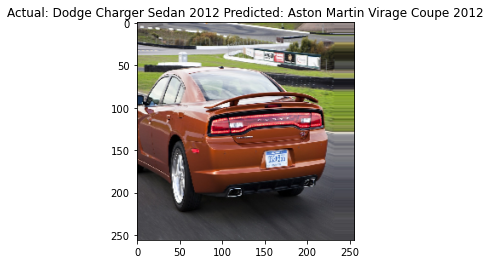

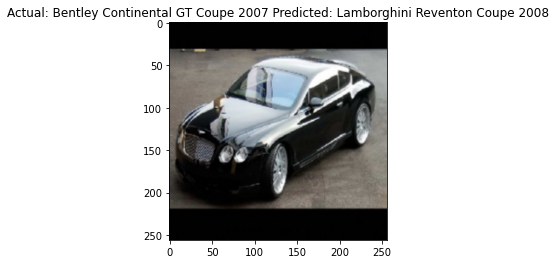

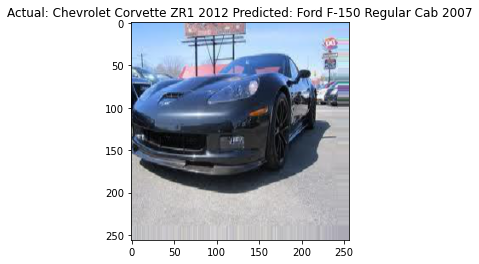

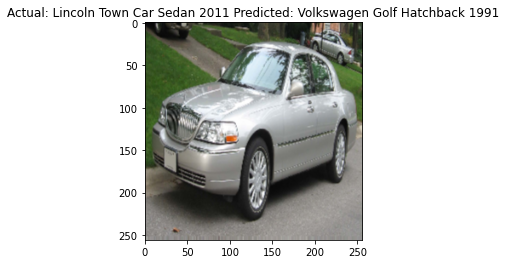

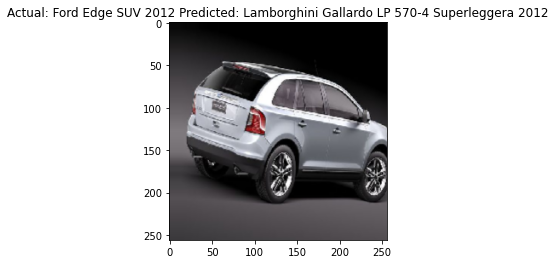

In [103]:
# predicting a few from testing data with model1
test_images, test_classes = next(testing_data)
predicted_classes = model1.predict(test_images)
for i in range(0, test_images.shape[0]):
    image = test_images[i]
    prediction = predicted_classes[i]
    predicted = classes[np.argmax(prediction)]
    actual = classes[np.argmax(test_classes[i])]
    plt.figure(i)
    plt.title('Actual: ' + actual + ' Predicted: ' + predicted)
    plt.imshow(image)

<ipython-input-102-37a59ec9940e>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


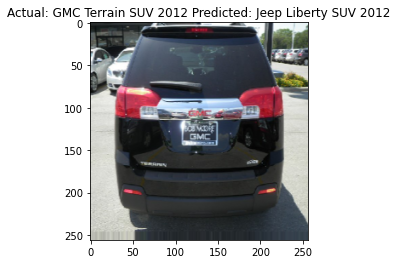

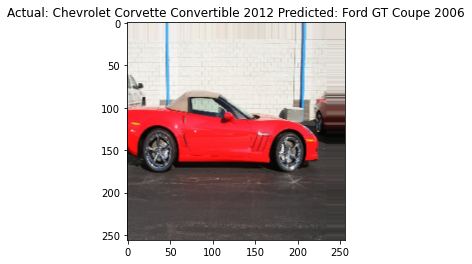

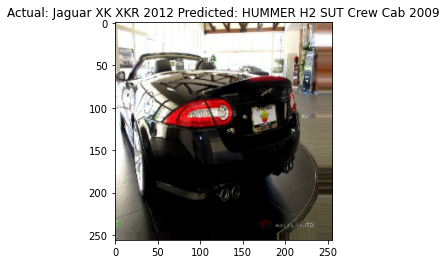

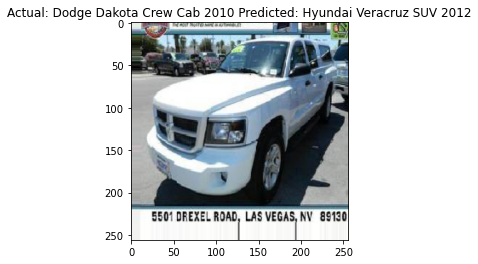

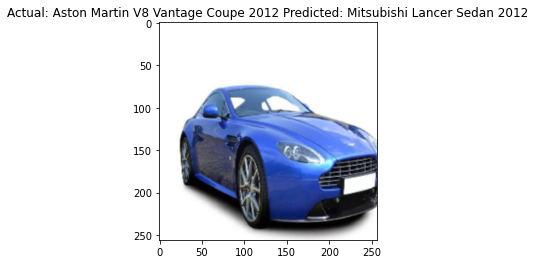

...

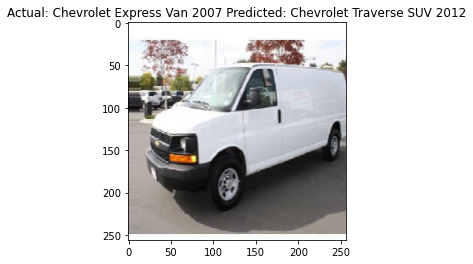

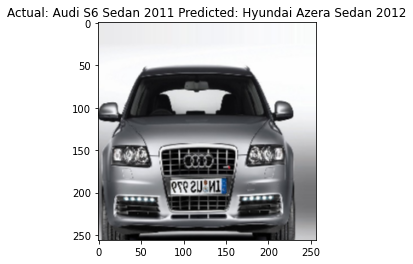

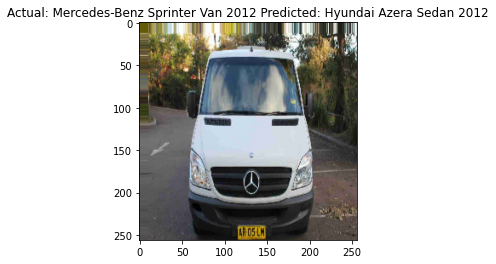

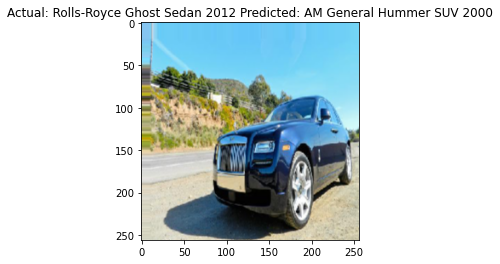

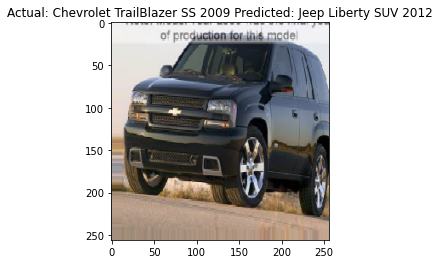

In [102]:
# predicting a few from testing data with model2
test_images, test_classes = next(testing_data)
predicted_classes = model2.predict(test_images)
for i in range(0, test_images.shape[0]):
    image = test_images[i]
    prediction = predicted_classes[i]
    predicted = classes[np.argmax(prediction)]
    actual = classes[np.argmax(test_classes[i])]
    plt.figure(i)
    plt.title('Actual: ' + actual + ' Predicted: ' + predicted)
    plt.imshow(image)

<ipython-input-101-b08bf3dd2203>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


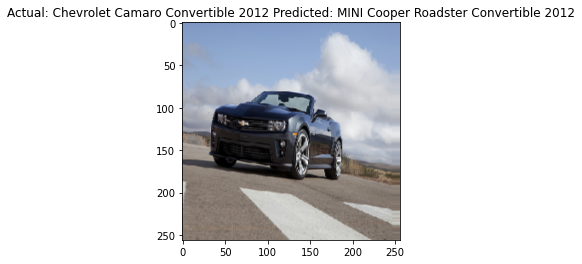

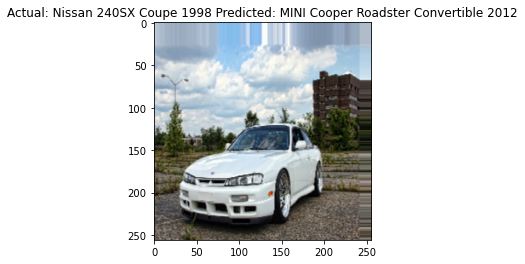

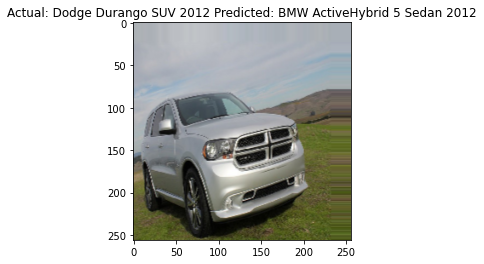

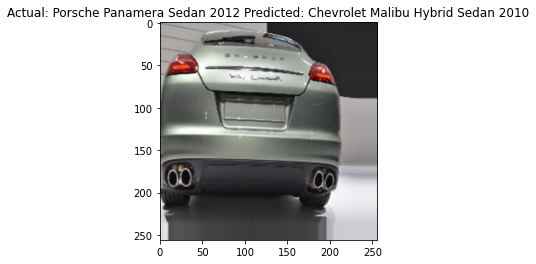

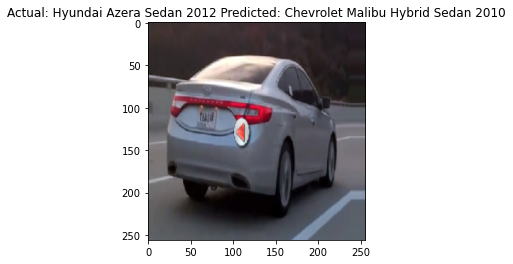

...

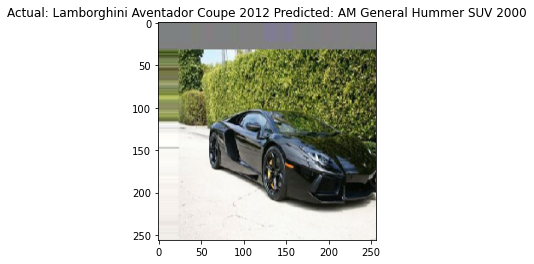

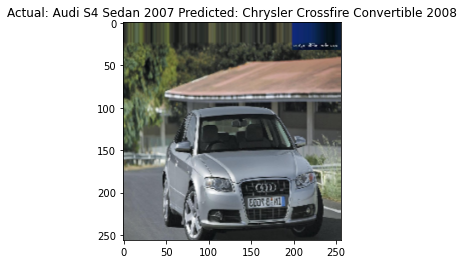

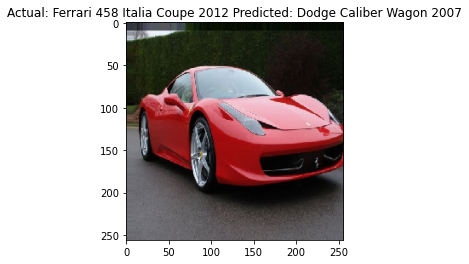

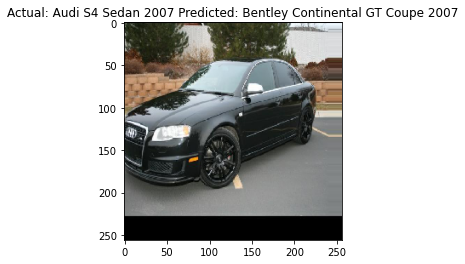

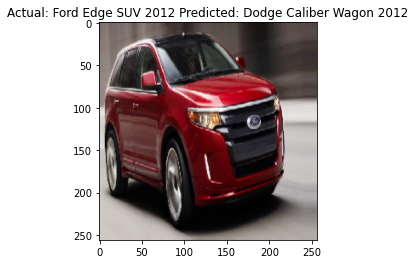

In [101]:
# predicting a few from testing data with model3
test_images, test_classes = next(testing_data)
predicted_classes = model3.predict(test_images)
for i in range(0, test_images.shape[0]):
    image = test_images[i]
    prediction = predicted_classes[i]
    predicted = classes[np.argmax(prediction)]
    actual = classes[np.argmax(test_classes[i])]
    plt.figure(i)
    plt.title('Actual: ' + actual + ' Predicted: ' + predicted)
    plt.imshow(image)

In [76]:
# model found on kaggle using this dataset
# https://www.kaggle.com/elmahy/tiny-models-with-the-cars-dataset-70-accuracy

IMAGE_SIZE = 224
IMG_SHAPE = (IMAGE_SIZE, IMAGE_SIZE, 3)

base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,alpha = .5,
                                               include_top=False, 
                                               weights='imagenet')

x = base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = Dropout(.6)(x)
prediction_layer = tf.keras.layers.Dense(196, activation='softmax')(x)

learning_rate = 0.0001

model=Model(inputs=base_model.input,outputs=prediction_layer)

for layer in model.layers[:80]:
    layer.trainable=False
for layer in model.layers[80:]:
    layer.trainable=True
# 

optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate,clipnorm=0.001)
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

lr_metric = get_lr_metric(optimizer)

model.compile(optimizer=optimizer,
             loss='categorical_crossentropy',
             metrics=['accuracy',lr_metric])

In [77]:
# changing the size of images to (224, 224)
training_data2 = training_data_generator.flow_from_directory('projectdata/car_data/car_data/train/',
                                              target_size=(224,224),
                                              batch_size=32,
                                              class_mode='categorical')

testing_data2 = testing_data_generator.flow_from_directory('projectdata/car_data/car_data/test',
                                              target_size=(224,224),
                                              batch_size=32,
                                              class_mode='categorical')

# fitting the model
hist = model.fit(training_data2,
                            epochs=50,
                            steps_per_epoch=100,
                            validation_data=testing_data2,
                            validation_steps=50)

Found 8144 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.
Epoch 1/50
100/100 [==============================] - 57s 532ms/step - loss: 5.8189 - accuracy: 0.0053 - lr: 1.0000e-04 - val_loss: 5.5411 - val_accuracy: 0.0063 - val_lr: 1.0000e-04
Epoch 2/50
100/100 [==============================] - 53s 529ms/step - loss: 5.4282 - accuracy: 0.0088 - lr: 1.0000e-04 - val_loss: 5.5026 - val_accuracy: 0.0106 - val_lr: 1.0000e-04
Epoch 3/50
100/100 [==============================] - 53s 533ms/step - loss: 5.2396 - accuracy: 0.0129 - lr: 1.0000e-04 - val_loss: 5.4026 - val_accuracy: 0.0100 - val_lr: 1.0000e-04
Epoch 4/50
100/100 [==============================] - 53s 530ms/step - loss: 5.1052 - accuracy: 0.0228 - lr: 1.0000e-04 - val_loss: 5.1709 - val_accuracy: 0.0338 - val_lr: 1.0000e-04
Epoch 5/50
100/100 [==============================] - 52s 523ms/step - loss: 4.9290 - accuracy: 0.0377 - lr: 1.0000e-04 - val_loss: 4.8104 - val_accuracy: 0.0456 - val_lr: 1.0000e-

100/100 [==============================] - 54s 537ms/step - loss: 0.9116 - accuracy: 0.7513 - lr: 1.0000e-04 - val_loss: 1.4007 - val_accuracy: 0.6375 - val_lr: 1.0000e-04
Epoch 46/50
100/100 [==============================] - 54s 544ms/step - loss: 0.8725 - accuracy: 0.7513 - lr: 1.0000e-04 - val_loss: 1.4612 - val_accuracy: 0.6169 - val_lr: 1.0000e-04
Epoch 47/50
100/100 [==============================] - 53s 528ms/step - loss: 0.8535 - accuracy: 0.7597 - lr: 1.0000e-04 - val_loss: 1.2954 - val_accuracy: 0.6731 - val_lr: 1.0000e-04
Epoch 48/50
100/100 [==============================] - 53s 530ms/step - loss: 0.8224 - accuracy: 0.7798 - lr: 1.0000e-04 - val_loss: 1.2715 - val_accuracy: 0.6737 - val_lr: 1.0000e-04
Epoch 49/50
100/100 [==============================] - 53s 526ms/step - loss: 0.8071 - accuracy: 0.7776 - lr: 1.0000e-04 - val_loss: 1.3206 - val_accuracy: 0.6488 - val_lr: 1.0000e-04
Epoch 50/50
100/100 [==============================] - 53s 536ms/step - loss: 0.7703 - accur

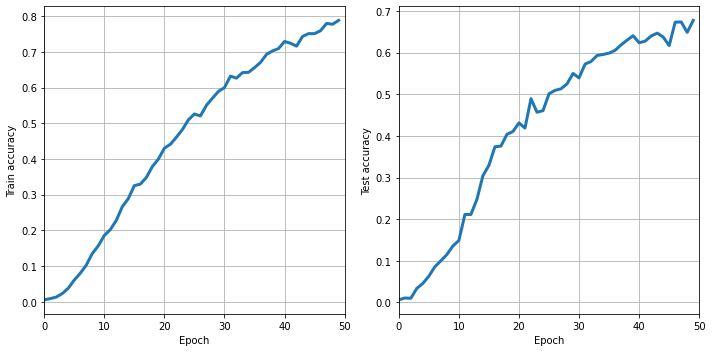

In [78]:
plt.figure(figsize=(10,5))

# plotting graph of training accuracy vs epoch
plt.subplot(1,2,1)
acc = hist.history['accuracy']
plt.plot(acc, '-', linewidth=3)
plt.xlim([0, 50])
plt.xlabel('Epoch')
plt.ylabel('Train accuracy')
plt.grid()

# plotting graph of testing accuracy vs epoch
plt.subplot(1,2,2)
val_acc = hist.history['val_accuracy']
plt.plot(val_acc, '-', linewidth=3)
plt.xlim([0, 50])
plt.xlabel('Epoch')
plt.ylabel('Test accuracy')
plt.grid()

plt.tight_layout()

In [91]:
# new size for the google images
small_img1 = np.array(Image.open('googled/testing/1.jpg'))
small_img1 = transform.resize(small_img1, (224, 224, 3))

small_img2 = np.array(Image.open('googled/testing/2.jpg'))
small_img2 = transform.resize(small_img2, (224, 224, 3))

small_img3 = np.array(Image.open('googled/testing/3.jpg'))
small_img3 = transform.resize(small_img3, (224, 224, 3))

small_img4 = np.array(Image.open('googled/testing/4.jpg'))
small_img4 = transform.resize(small_img4, (224, 224, 3))

small_img5 = np.array(Image.open('googled/testing/5.jpg'))
small_img5 = transform.resize(small_img5, (224, 224, 3))

small_images = np.array([small_img1, small_img2, small_img3, small_img4, small_img5])
predicted = model.predict(small_images)
for i in range(5):
    index = np.argmax(predicted[i])
    print(f"Actual: {names[i]}, Predicted: {classes[index]}")

Actual: Bentley Continental GT Coupe 2012, Predicted: Fisker Karma Sedan 2012
Actual: Bugatti Veyron 16.4 Convertible 2009, Predicted: Bugatti Veyron 16.4 Coupe 2009
Actual: Ferrari 458 Italia Coupe 2012, Predicted: Ferrari 458 Italia Coupe 2012
Actual: Lamborghini Aventador Coupe 2012, Predicted: Lamborghini Gallardo LP 570-4 Superleggera 2012
Actual: Rolls-Royce Ghost Sedan 2012, Predicted: Rolls-Royce Ghost Sedan 2012


<ipython-input-104-02f2af4c79f7>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


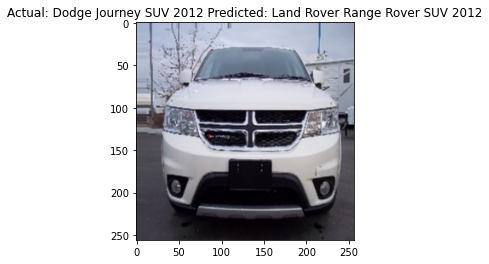

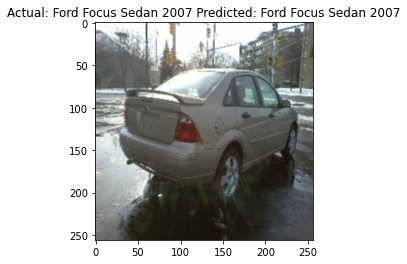

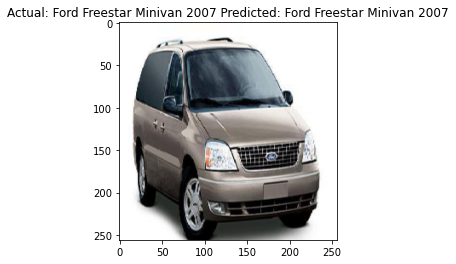

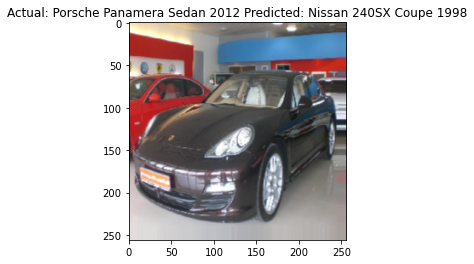

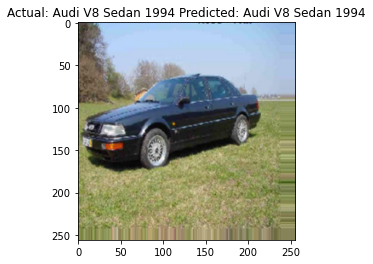

...

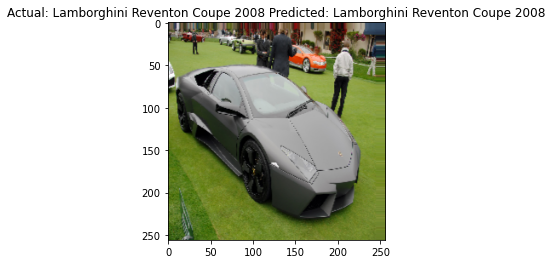

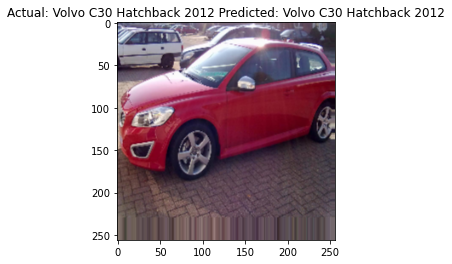

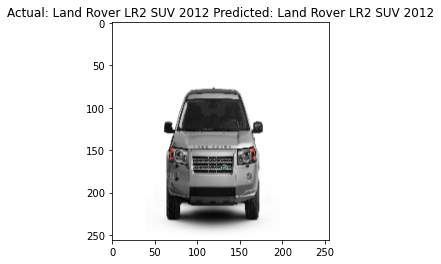

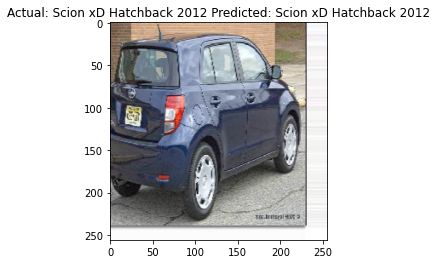

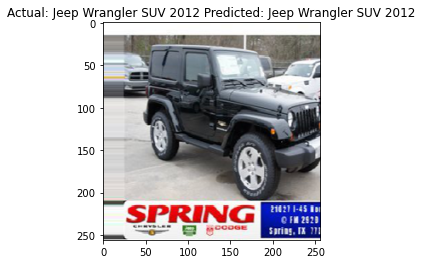

In [104]:
# predict a few from testing data using new model
test_images, test_classes = next(testing_data)
predicted_classes = model.predict(test_images)
for i in range(0, test_images.shape[0]):
    image = test_images[i]
    prediction = predicted_classes[i]
    predicted = classes[np.argmax(prediction)]
    actual = classes[np.argmax(test_classes[i])]
    plt.figure(i)
    plt.title('Actual: ' + actual + ' Predicted: ' + predicted)
    plt.imshow(image)